# Reuse data exploration



## Data and packages

In [1]:
import json
import numpy as np
import pandas as pd

In [2]:
# data

path= "C:/Users/telmi/Documents/dhh23/EarlyModernReuse/early_modern_data-main/"

# C:\Users\telmi\Documents\dhh23\reuseportfolio
meta = path + "metadata.csv"
clip= path + "clip_classification.csv"

meta = pd.read_csv(meta, dtype={"page_id":str, "ecco_id":str})
clip = pd.read_csv(clip)

# similarity data
dpath="../../data/botanical_similarity_with_metadata.csv"
dpath="C:/Users/telmi/Documents/dhh23/image-similarity-detection/code/datanew.csv"

print(dpath)
df= pd.read_csv(dpath)
df.head()

C:/Users/telmi/Documents/dhh23/image-similarity-detection/code/datanew.csv


,original_image,similar_image,similarity_score
0,049030010304390_2.png,049030010306110_3.png,0.916535
1,049030010304390_2.png,064340010200770_4.png,0.910169
2,049030010304390_2.png,049030010300880_2.png,0.905190
3,049030010304390_2.png,049030010207390_3.png,0.900482
4,049030010202250_0.png,049030010207560_0.png,0.908386


In [3]:
# pickled files

import pickle
from PIL import Image

similarNames_path = "C:/Users/telmi/Documents/dhh23/image-similarity-detection/similar_names.pkl"
similarValues_path = "C:/Users/telmi/Documents/dhh23/image-similarity-detection/similar_values.pkl"

# open a file where you stored the pickled data
file = open(similarNames_path, 'rb')
simNames = pickle.load(file)
file.close()

file = open(similarValues_path, 'rb')
simValues = pickle.load(file)
file.close()

In [4]:
# see all metadata columns
meta.columns 

# relevant columns:
# ["page_id","ecco_id","work_id", "ecco_full_title","gatherings","publication_year","publication_decade","document_type","authors","sub_category"]

Index(['page_id', 'ecco_id', 'page_number', 'caption_texts', 'estc_id',
       'ecco_full_title', 'number_of_pages', 'language_primary', 'gatherings',
       'publication_year', 'publication_decade', 'work_id',
       'publication_place', 'publication_country', 'document_type',
       'sub_category', 'authors'],
      dtype='object')

In [5]:
from utils import *


In [6]:

# rename columns
clip=clip.rename(columns={"Image": "original_image"})


# new column for page id from the image file name
clip["page_id"] = clip["original_image"].apply(lambda x: x.split("_")[0])
df["page_id"] = df["original_image"].apply(lambda x: x.split("_")[0])
df["page_id2"] = df["similar_image"].apply(lambda x: x.split("_")[0])

# merge classification data with metadata

data=df.merge(clip)

data=data[data["Score"]>50]
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5027 entries, 0 to 6075
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   original_image    5027 non-null   object 
 1   similar_image     5027 non-null   object 
 2   similarity_score  5027 non-null   float64
 3   page_id           5027 non-null   object 
 4   page_id2          5027 non-null   object 
 5   Category          5027 non-null   object 
 6   Score             5027 non-null   float64
 7   Second_choice     5027 non-null   object 
 8   2ndScore          5027 non-null   float64
dtypes: float64(3), object(6)
memory usage: 392.7+ KB


In [7]:
# relevant metadata
cols= ["page_id","ecco_id","work_id", "ecco_full_title","gatherings","publication_year","publication_decade","document_type","authors","sub_category"]

meta_sub = meta[cols]

data=data.merge(meta_sub, on ="page_id", how="left")

In [8]:
# add metadata for the reused pics
data=data.merge(meta_sub, left_on ="page_id2", right_on="page_id", how="left", suffixes=["","_2"])

# sort so that you see what the source is
data1= data[data["publication_year"]<data["publication_year_2"]] # _2 = where is the original pic reused
data2= data[data["publication_year"]>=data["publication_year_2"]] # _2 = where reuse comes from

print(len(data1),len(data2))

1306 3701


In [9]:
# filter data so that it does not contain reprints (the same work id)

newprints=data[data["work_id"]!=data["work_id_2"]]

# convert to numeric 
newprints["similarity_score"] = pd.to_numeric(newprints["similarity_score"])

C:\Users\telmi\AppData\Local\Temp\ipykernel_14332\1961390881.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newprints["similarity_score"] = pd.to_numeric(newprints["similarity_score"])


In [10]:
print(len(newprints.drop_duplicates(["original_image","similar_image"])),len(newprints))
newprints=newprints.drop_duplicates(["original_image","similar_image"])

1812 1812


## Part 1 - Quality evaluation

First, I wanted to evaluate whether the results from the reuse detection algorithm were reliable.

Threshold: 0.9
Plotting similar images for 049030010207470_1.png


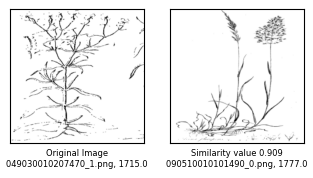

Plotting similar images for 049030010200530_0.png


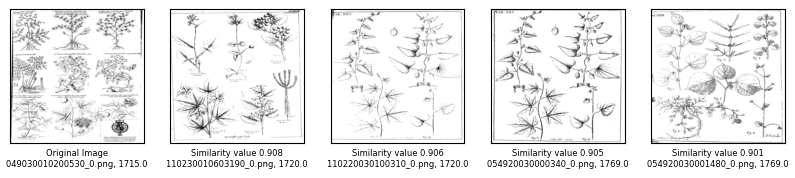

Plotting similar images for 103590030003310_1.png


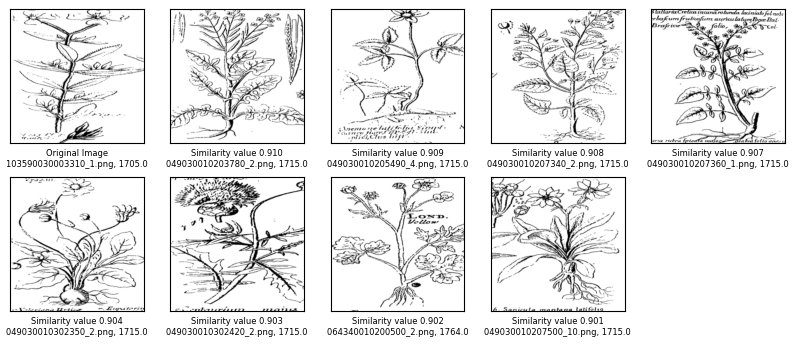

Plotting similar images for 103590030003310_1.png


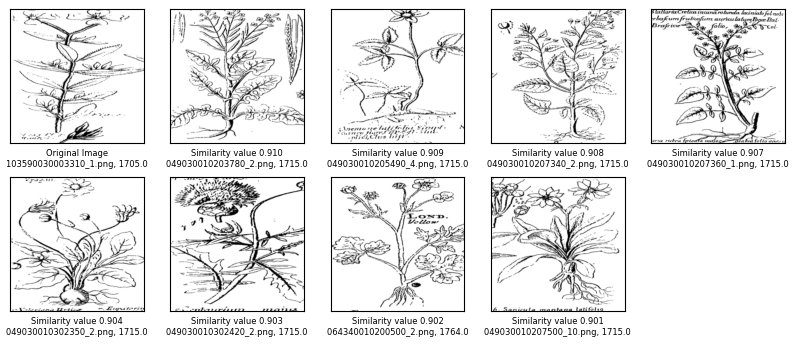

Plotting similar images for 110220030502540_0.png


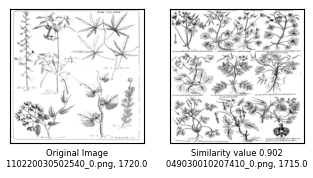

Threshold: 0.91
Plotting similar images for 049030010203770_3.png


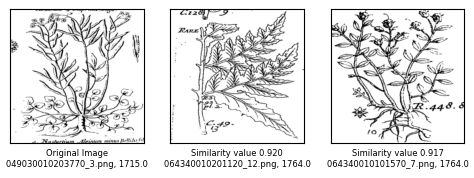

Plotting similar images for 115830020004440_3.png


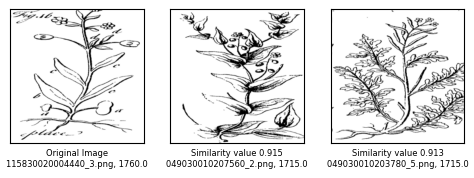

Plotting similar images for 064340010200760_0.png


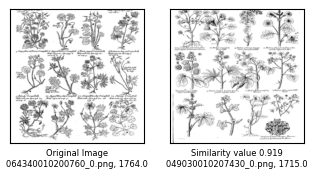

Plotting similar images for 118650010003680_0.png


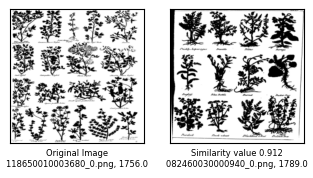

Plotting similar images for 034230010001890_0.png


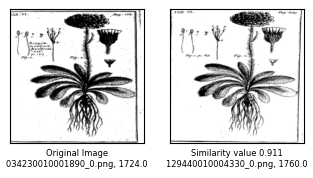

Threshold: 0.92
Plotting similar images for 110220030502550_0.png


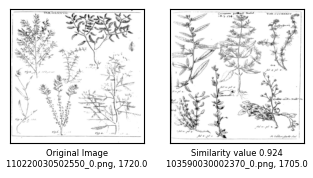

Plotting similar images for 054920020002510_0.png


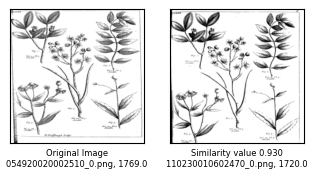

Plotting similar images for 099320011501130_0.png


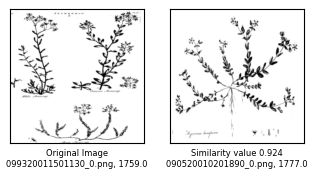

Plotting similar images for 054920020003020_0.png


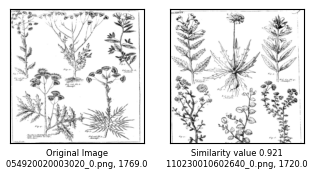

Plotting similar images for 049030010207340_2.png


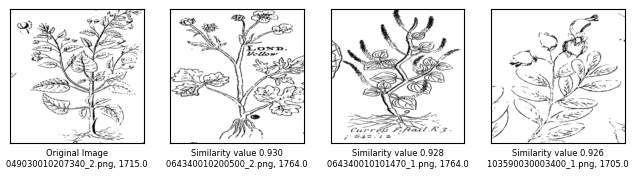

Threshold: 0.93
Plotting similar images for 049030010207390_3.png


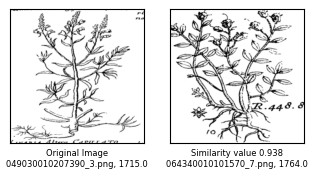

Plotting similar images for 110220030100320_0.png


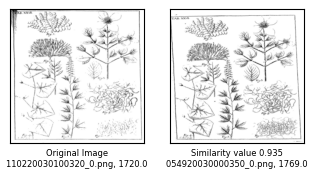

Plotting similar images for 097230011400210_0.png


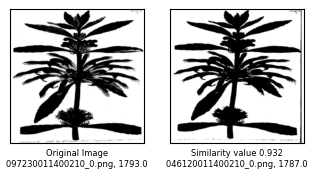

Plotting similar images for 110230010602450_0.png


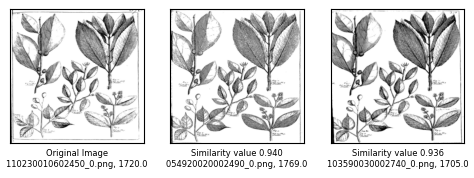

Plotting similar images for 048590050002020_0.png


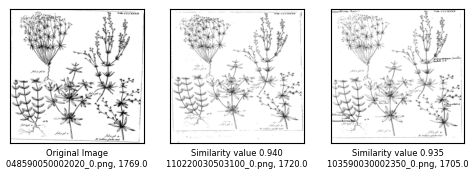

Threshold: 0.94
Plotting similar images for 110220030503210_0.png


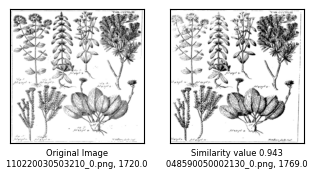

Plotting similar images for 054920020003290_0.png


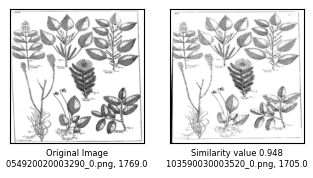

Plotting similar images for 054920020003310_0.png


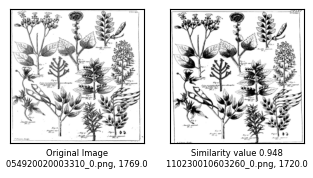

Plotting similar images for 110230010603260_0.png


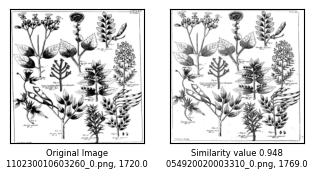

Plotting similar images for 082460030004010_0.png


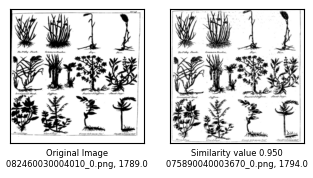

Threshold: 0.95
Plotting similar images for 103590030002350_0.png


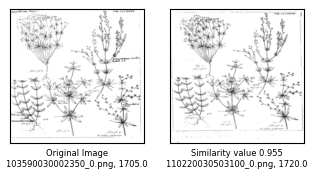

Plotting similar images for 075890040001530_0.png


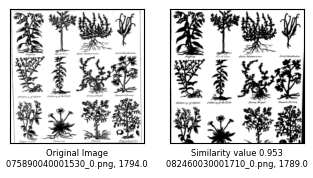

Plotting similar images for 054920030001260_0.png


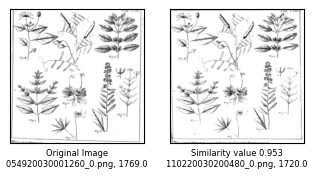

Plotting similar images for 006300240000520_0.png


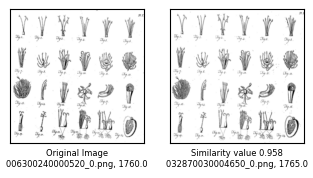

Plotting similar images for 046120010800210_0.png


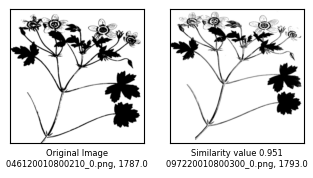

Threshold: 0.96
Plotting similar images for 054920030000360_0.png


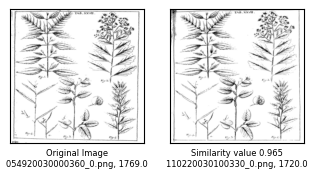

Plotting similar images for 110230010602980_0.png


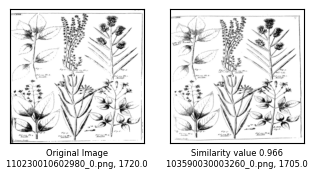

Plotting similar images for 064340010101330_2.png


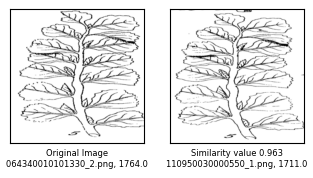

Plotting similar images for 103590030002760_0.png


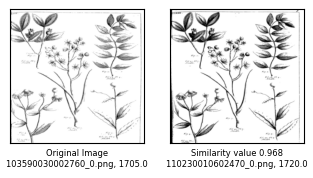

Plotting similar images for 054890030003910_0.png


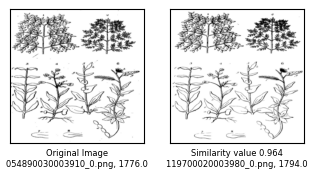

In [11]:
# plot the most reused image

inputDir="C:/Users/telmi/Documents/dhh23/image-similarity-detection/res"

# plot similar images for different thresholds to see how well they match

for ts in [0.9,0.91,0.92,0.93,0.94,0.95,0.96]:
    # filter data
    temp = newprints.drop_duplicates(["original_image","similar_image"])[(newprints["similarity_score"] >= ts) & (newprints["similarity_score"] < (ts+0.01))]
    print("Threshold:", ts)               
    for ix in temp.sample(5)["original_image"]:
        print("Plotting similar images for" , ix)
        plotImages(ix,inputDir,temp)


It seems that a similarity score above 0.91 gives results that are mostly cases of reuse of the same picture.

In [13]:
# double-checking

# subset
df91 = newprints[newprints["similarity_score"]>=0.91]
df91

,original_image,similar_image,similarity_score,page_id,page_id2,Category,Score,Second_choice,2ndScore,ecco_id,...,page_id_2,ecco_id_2,work_id_2,ecco_full_title_2,gatherings_2,publication_year_2,publication_decade_2,document_type_2,authors_2,sub_category_2
1,049030010304390_2.png,064340010200770_4.png,0.910169,049030010304390,064340010200770,botanical,90.966797,animal,6.695557,0490300103,...,064340010200770,0643400102,102916-jacobi petiveri opera historiam natural...,"Jacobi Petiveri Opera, historiam naturalem spe...",NaN,1764.0,1760.0,Book,"Petiver, James, 1663 or 1664-1718.",scientificimprovementnaturalphilosophy
6,103590030002610_0.png,110230010602330_0.png,0.949483,103590030002610,110230010602330,botanical,53.906250,animal,40.673828,1035900300,...,110230010602330,1102300106,158152-leonardi plukenetii md opera omnia bota...,"Leonardi Plukenetii, M.D. Opera omnia botanica...",NaN,1720.0,1720.0,Book,"Plukenet, Leonard, 1642-1706.",scientificimprovementnaturalhistory
7,103590030002610_0.png,054920020002370_0.png,0.947986,103590030002610,054920020002370,botanical,53.906250,animal,40.673828,1035900300,...,054920020002370,0549200200,158150-leonardi plukenetii amaltheum botanicum i,Leonardi Plukenetii amaltheum botanicum. (i.e....,4to,1769.0,1760.0,Book,"Plukenet, Leonard, 1642-1706.",scientificimprovementnaturalhistory
27,110220030100150_0.png,054920030000170_0.png,0.919521,110220030100150,054920030000170,botanical,64.550781,animal,31.469727,1102200301,...,054920030000170,0549200300,158153-leonardi plukenetii phytographia sive s...,"Leonardi Plukenetii phytographia, sive stirpiu...",4to,1769.0,1760.0,Book,"Plukenet, Leonard, 1642-1706.",scientificimprovementnaturalhistory
31,097220010100680_0.png,046120010100660_0.png,0.938755,097220010100680,046120010100660,botanical,68.945312,animal,19.750977,0972200101,...,046120010100660,0461200101,X-T153227,"The botanical Magazine; or, Flower-Garden Disp...",8vo,1787.0,1780.0,Book,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,110220030100690_0.png,054920030000720_0.png,0.935344,110220030100690,054920030000720,botanical,51.806641,animal,29.516602,1102200301,...,054920030000720,0549200300,158153-leonardi plukenetii phytographia sive s...,"Leonardi Plukenetii phytographia, sive stirpiu...",4to,1769.0,1760.0,Book,"Plukenet, Leonard, 1642-1706.",scientificimprovementnaturalhistory
5002,054920020003190_1.png,103590030003420_1.png,0.921296,054920020003190,103590030003420,botanical,53.857422,animal,40.039062,0549200200,...,103590030003420,1035900300,158151-leonardi plukenetii amaltheum botanicum...,Leonardi Plukenetii Amaltheum botanicum (i.e.)...,2fo,1705.0,1700.0,Book,"Plukenet, Leonard, 1642-1706.",scientificimprovementnaturalhistory
5009,110230010603150_1.png,103590030003430_1.png,0.911278,110230010603150,103590030003430,botanical,66.894531,animal,31.591797,1102300106,...,103590030003430,1035900300,158151-leonardi plukenetii amaltheum botanicum...,Leonardi Plukenetii Amaltheum botanicum (i.e.)...,2fo,1705.0,1700.0,Book,"Plukenet, Leonard, 1642-1706.",scientificimprovementnaturalhistory
5022,129440020001130_1.png,115480030101370_0.png,0.924676,129440020001130,115480030101370,botanical,70.263672,animal,27.514648,1294400200,...,115480030101370,1154800301,8933-a curious herbal containing five hundred ...,"A curious herbal, containing five hundred cuts...",2fo,1782.0,1780.0,Book,"Blackwell, Elizabeth, active 1737.",scientificimprovementmedicineandanatomy


Plotting similar images for 049030010207380_1.png


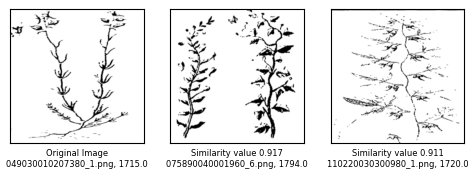

Plotting similar images for 054920020003080_1.png


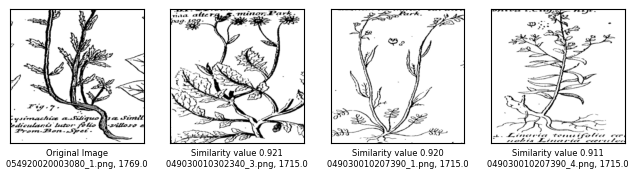

Plotting similar images for 099320011500850_0.png


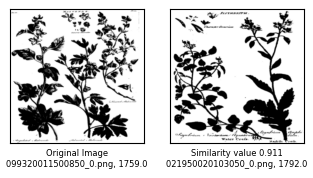

Plotting similar images for 101150030102970_0.png


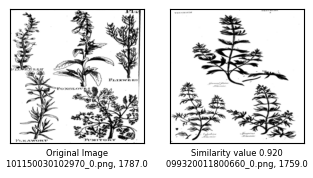

Plotting similar images for 110230010603000_1.png


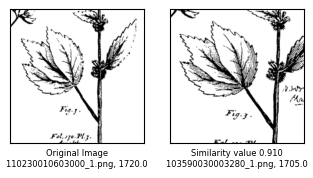

Plotting similar images for 110950030000520_1.png


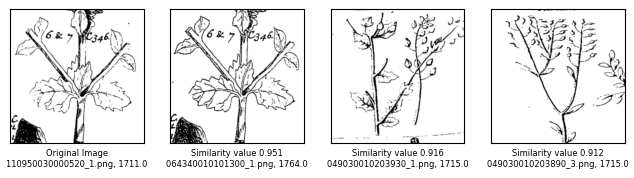

Plotting similar images for 049130040003650_0.png


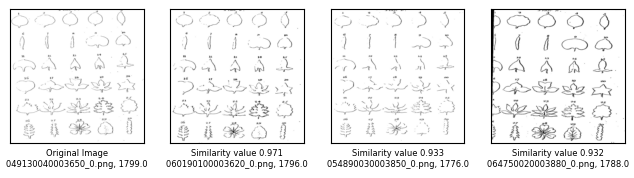

Plotting similar images for 064340010101300_5.png


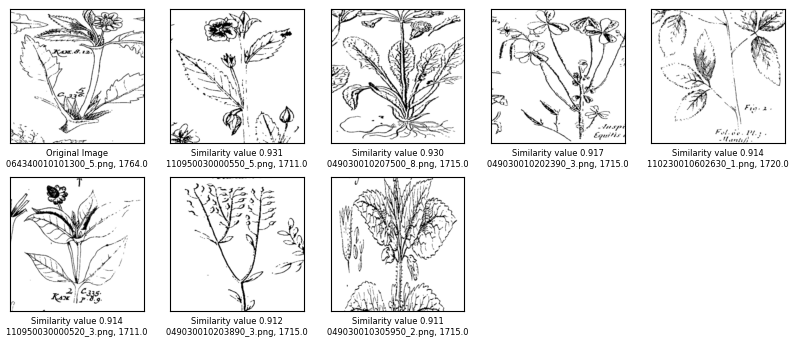

Plotting similar images for 110220030502980_0.png


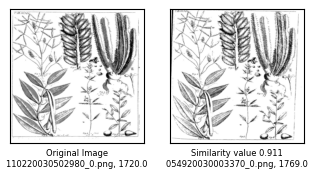

Plotting similar images for 103590030003530_0.png


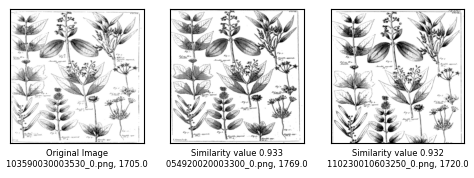

In [14]:
# examine some images

for ix in df91.sample(10)["original_image"]:
    print("Plotting similar images for" , ix)
    plotImages(ix,inputDir,df91)

This quick check shows that not all results are perfect, but the quality is good enough to continue.


Next, I wanted to arrange the pictures so that the earlier one in each match is the original picture, and the similar image is the one published later. There might be a faster way of doing this, but I used a loop: 

In [15]:
# make a new dataframe where the earlier year is always work_id, and the reuse work_id_2

df2 = pd.DataFrame()

col_1= ["original_image", 'page_id', 'ecco_id',
       'work_id', 'ecco_full_title', 'gatherings', 'publication_year',
       'publication_decade', 'document_type', 'authors', 'sub_category']
col_2=["similar_image",'page_id_2', 'ecco_id_2', 'work_id_2', 'ecco_full_title_2',
       'gatherings_2', 'publication_year_2', 'publication_decade_2',
       'document_type_2', 'authors_2', 'sub_category_2']
col_dict1= {c1:c2 for c1,c2 in zip(col_1,col_2)}
col_dict2={c2:c1 for c1,c2 in zip(col_1,col_2)}
col_dict = {**col_dict1,**col_dict2}


# loop the df

for i in range(len(df91)):
    row = df91.iloc[i]
    y1 = row["publication_year"]
    y2 = row["publication_year_2"]
    temp=pd.DataFrame(row).T 
    if y1> y2: 
        # rename columns if the reuse is spotted the wrong way
        temp=temp.rename(columns=col_dict)
        df2 = pd.concat([df2,temp])
    else:
        df2 = pd.concat([df2,temp])

In [16]:
# drop potential duplicates that were created when reordering the reuse
df2 =df2.drop_duplicates(["original_image","similar_image"])

In [17]:
# now, I can group by the original image to trace those work/pic ids that have been reused the most:

print("Work ids that have the most reused pictures")
print(df2.groupby(["work_id"])["similar_image"].nunique().sort_values(ascending=False).head(10))


Work ids that have the most reused pictures
work_id
158152-leonardi plukenetii md opera omnia botanica in sex tomos divisa viz i ii iii phytographia iv almagestum botanicum v almagesti botanici mantissa vi amaltheum botanicum                                                                                                                                                   136
158151-leonardi plukenetii amaltheum botanicum ie stirpium indicarum alterum copiae cornu millenas ad minimum and bis centum diversas species novas and indictas nominatim comprehendens quarum sexcenae and insuper selectis iconibus aeneisque tabulis in gratiam phytosophorum exquisite and summo artificio illustrantur    110
8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta                                                                                                                                    

In [18]:
print("Work ids that have been used in the biggest number of *different* publications")
print(df2.groupby(["work_id"])["work_id_2"].nunique().sort_values(ascending=False).head(10))


Work ids that have been used in the biggest number of *different* publications
work_id
8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta                                                                                                                                                        15
22710-vegetable system or series of experiments and observations tending to explain internal structure and life of plants                                                                                                                                                                                                       11
158152-leonardi plukenetii md opera omnia botanica in sex tomos divisa viz i ii iii phytographia iv almagestum botanicum v almagesti botanici mantissa vi amaltheum botanicum                                                                                              

In [19]:
print("The pictures that have been copied the most")
print(df2.groupby(["original_image"]).size().sort_values(ascending=False).head(10))


The pictures that have been copied the most
original_image
049030010306840_3.png    6
065020090000690_0.png    5
049030010207390_4.png    5
099320011301010_0.png    4
049030010203800_3.png    4
049030010207340_2.png    4
082460030003900_0.png    4
049030010207390_3.png    4
049030010203770_3.png    4
110950030000550_5.png    4
dtype: int64


I wanted to have a closer look to these top pictures:


plotting image 049030010306840_3.png from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta 
by Morison, Robert, 1620-1683.


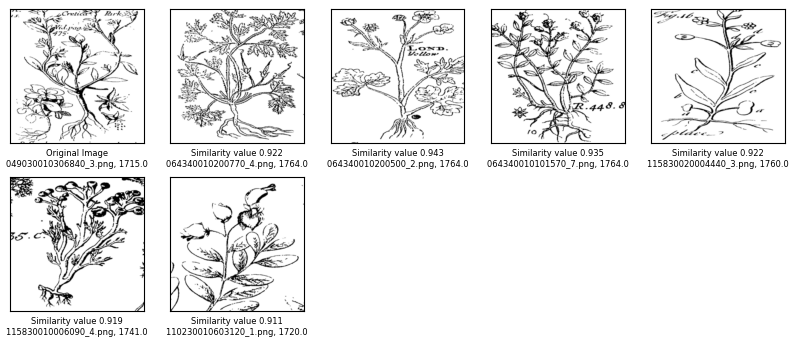

plotting image 065020090000690_0.png from X-T127734 
by nan


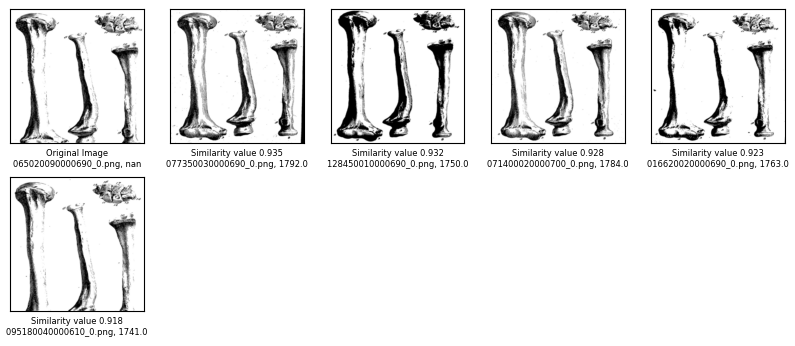

plotting image 049030010207390_4.png from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta 
by Morison, Robert, 1620-1683.


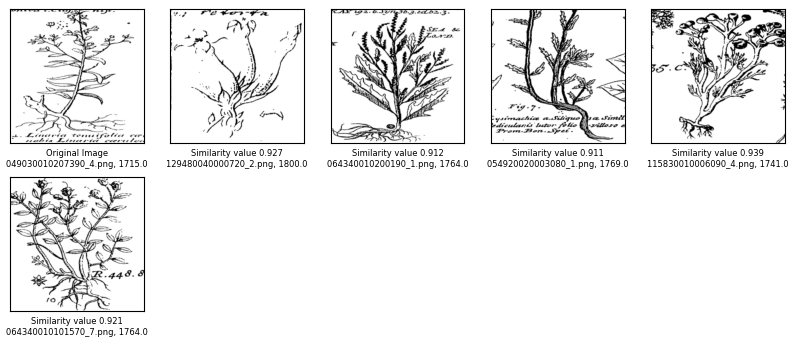

plotting image 099320011301010_0.png from 22710-vegetable system or series of experiments and observations tending to explain internal structure and life of plants 
by Hill, John, 1714?-1775.


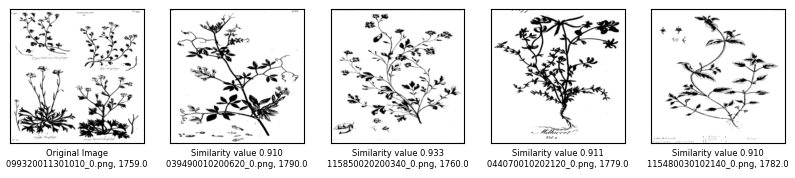

plotting image 049030010203800_3.png from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta 
by Morison, Robert, 1620-1683.


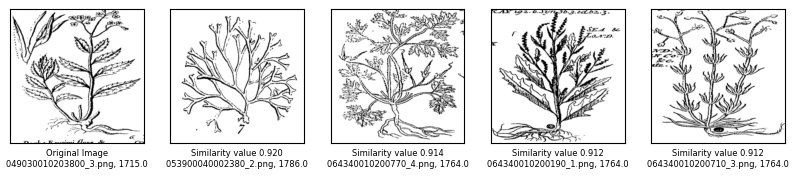

plotting image 049030010207340_2.png from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta 
by Morison, Robert, 1620-1683.


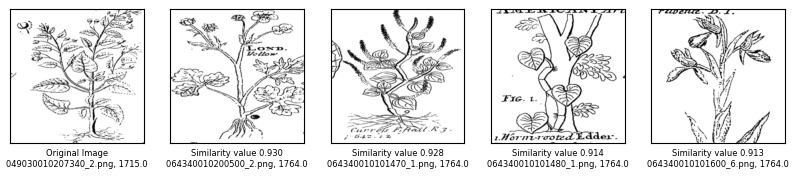

plotting image 082460030003900_0.png from 211-english physitian enlarged with three hundred sixty and nine medicines made of english herbs that were not in any impression until this 
by Culpeper, Nicholas, 1616-1654.


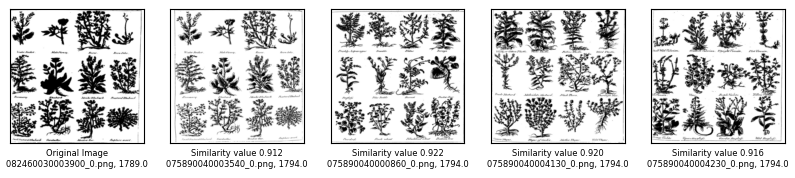

plotting image 049030010207390_3.png from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta 
by Morison, Robert, 1620-1683.


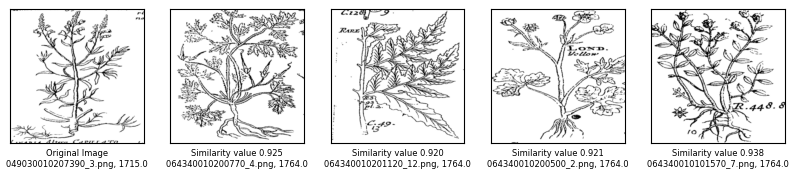

plotting image 049030010203770_3.png from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta 
by Morison, Robert, 1620-1683.


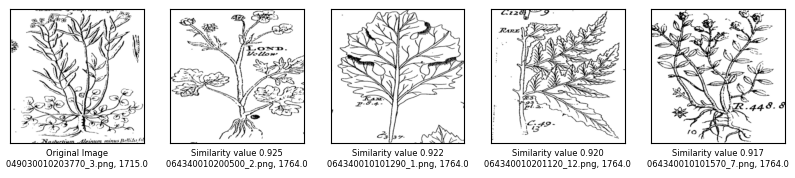

plotting image 110950030000550_5.png from 2260-gazophylacium naturae and artis 
by Petiver, James, 1663 or 1664-1718.


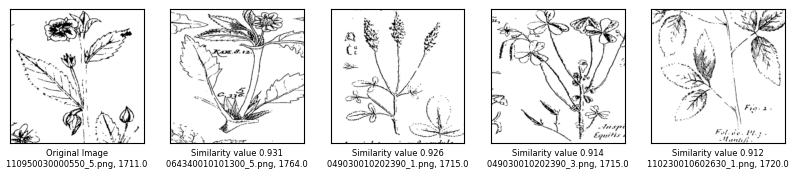

In [20]:

for ix in df2.groupby(["original_image"]).size().sort_values(ascending=False).head(10).index:
    book=df2[df2["original_image"]==ix]["work_id"].iloc[0]
    author=df2[df2["original_image"]==ix]["authors"].iloc[0]
    print("plotting image", str(ix), "from" ,book, "\nby", author)
    plotImages(ix,inputDir,df2)

Although not all of these matches stem from real reuse of the original picture, some observations can be made from the data.

- Cases related to Leonard Plukenet are reprints of his own work published in 1705, 1720, and 1769.
    - which explains the big reuse numbers, as whole books were reprinted.
- What is remarkable is that the first publications were published in folio, and the later ones in quarto, requiring new printing plates.
- Moreover, he lived in 1642 - 1706, so it is noticeable that his works were reprinted almost 100 years later.

In [21]:
#pic="103590030003260_0.png"
df2[df2["authors"]=="Plukenet, Leonard, 1642-1706."][["ecco_id", "publication_year","gatherings", "ecco_id_2","authors_2","publication_year_2","gatherings_2"]].drop_duplicates().sort_values("publication_year")

,ecco_id,publication_year,gatherings,ecco_id_2,authors_2,publication_year_2,gatherings_2
6,1035900300,1705.0,2fo,1102300106,"Plukenet, Leonard, 1642-1706.",1720.0,NaN
864,1035900300,1705.0,2fo,0549200300,"Plukenet, Leonard, 1642-1706.",1769.0,4to
464,1035900300,1705.0,2fo,0490300102,"Morison, Robert, 1620-1683.",1715.0,2fo
324,1035900300,1705.0,2fo,0485900500,"Plukenet, Leonard, 1642-1706.",1769.0,4to
4204,1035900300,1705.0,2fo,0490300103,"Morison, Robert, 1620-1683.",1715.0,2fo
7,1035900300,1705.0,2fo,0549200200,"Plukenet, Leonard, 1642-1706.",1769.0,4to
39,1035900300,1705.0,2fo,1102200305,"Plukenet, Leonard, 1642-1706.",1720.0,NaN
2069,1102200301,1720.0,NaN,0549200200,"Plukenet, Leonard, 1642-1706.",1769.0,4to
1053,1102300106,1720.0,NaN,0643400101,"Petiver, James, 1663 or 1664-1718.",1764.0,NaN
526,1102200303,1720.0,NaN,0549200200,"Plukenet, Leonard, 1642-1706.",1769.0,4to


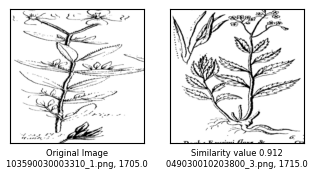

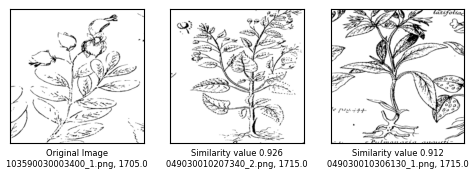

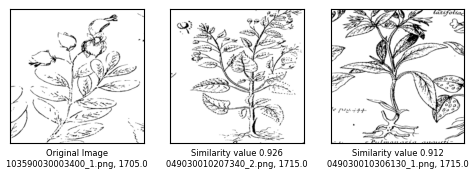

In [22]:
# Has Morison reused Plukenet or
petiver= "Petiver, James, 1663 or 1664-1718."
morison="Morison, Robert, 1620-1683."
plukenet="Plukenet, Leonard, 1642-1706."
plukenetiMorison=df2[(df2["authors"]==plukenet)&(df2["authors_2"]==morison)]
plukenetiMorison

for original in plukenetiMorison["original_image"]:
    plotImages(original,inputDir,plukenetiMorison)

The data does not contain cases of direct copies.

## Part 2 Exploration of image reuse across publication formats

plotting image from author: nan , published in format nan
reuse by author: nan , format: nan


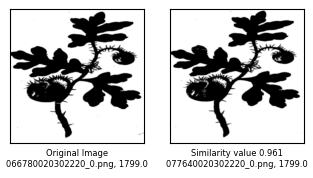

plotting image from author: nan , published in format nan
reuse by author: nan , format: 12mo


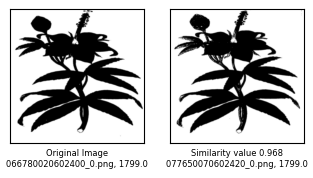

plotting image from author: nan , published in format nan
reuse by author: nan , format: nan


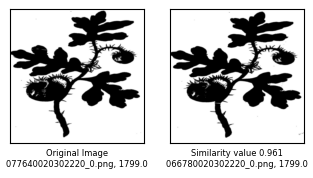

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan


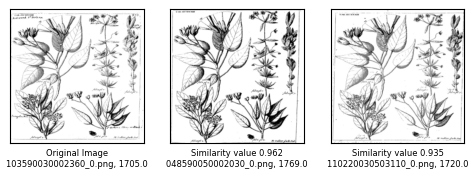

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan


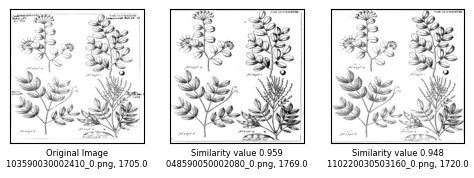

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


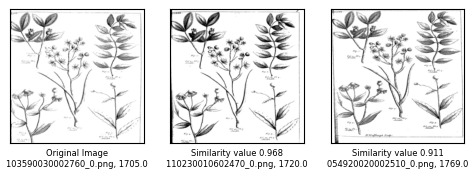

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


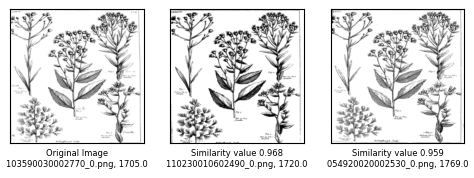

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan


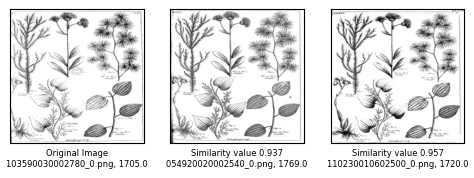

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan


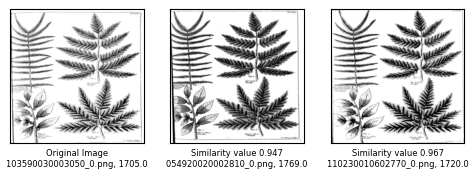

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


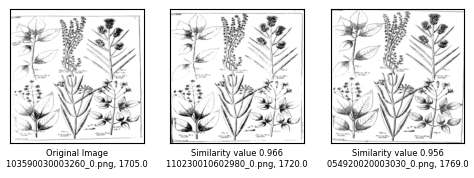

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format 2fo
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to
reuse by author: Plukenet, Leonard, 1642-1706. , format: nan


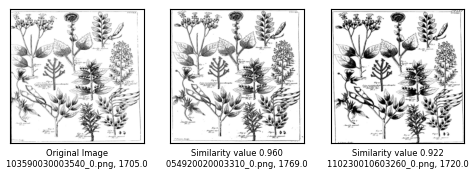

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


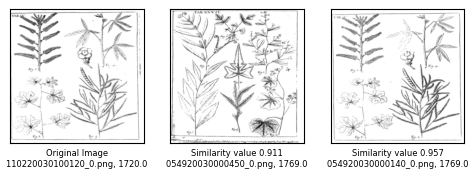

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


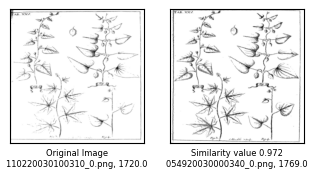

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


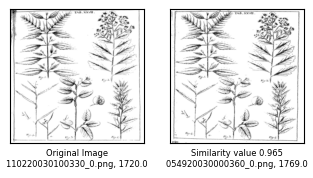

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


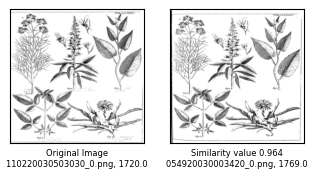

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


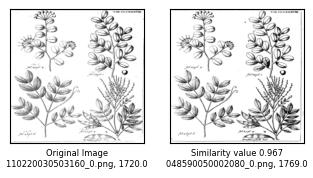

plotting image from author: Plukenet, Leonard, 1642-1706. , published in format nan
reuse by author: Plukenet, Leonard, 1642-1706. , format: 4to


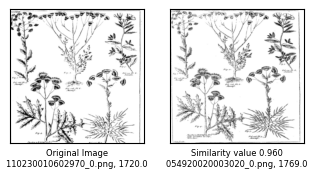

plotting image from author: Petiver, James, 1663 or 1664-1718. , published in format 2fo
reuse by author: Petiver, James, 1663 or 1664-1718. , format: nan


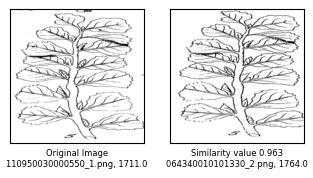

plotting image from author: Petiver, James, 1663 or 1664-1718. , published in format 2fo
reuse by author: Petiver, James, 1663 or 1664-1718. , format: nan


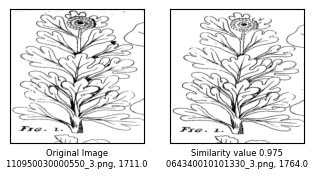

plotting image from author: Petiver, James, 1663 or 1664-1718. , published in format 2fo
reuse by author: Petiver, James, 1663 or 1664-1718. , format: nan


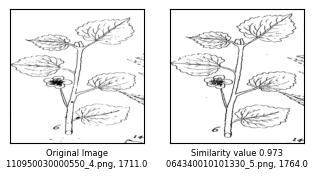

In [23]:
# accross formats
df_format= df2[df2["gatherings"]!=df2["gatherings_2"]] # the format is not the same
df_format = df_format[df_format["document_type"] !="pamphlet"]
#df_format =df_format[df_format["publication_year"] <=df_format["publication_year_2"]]

# sort by similarity score

sort_column="similarity_score"
sim_imgs=df_format.sort_values([sort_column],ascending=False).drop_duplicates("original_image").head(20).groupby("original_image")["similar_image"].apply(list)
orig_img=df_format.sort_values([sort_column],ascending=False).drop_duplicates("original_image").head(20).groupby("original_image")["original_image"].apply(list)
for o, s in zip(orig_img, sim_imgs):
    
    # print the work id
    book= df_format[df_format["original_image"]==o[0]]["work_id"].iloc[0]
    col="work_id_2"
    # alternatively print the author
    book= df_format[df_format["original_image"]==o[0]]["authors"].iloc[0]
    col="authors_2"
    
    #booknumber = df_format[df_format["original_image"]==o[0]]["n_reuse"].iloc[0]
    book_format = df_format[df_format["original_image"]==o[0]]["gatherings"].iloc[0]
    y = df_format[df_format["original_image"]==o[0]]["publication_year"].iloc[0]
    image = o[0]#row["original_image"]
    print("plotting image from author:", str(book), ", published in format", str(book_format))
    
    for s_id, f in zip(df_format[df_format["original_image"]==o[0]][col],df_format[df_format["original_image"]==o[0]]["gatherings_2"]):
        print("reuse by author:", s_id, ", format:", f)
    
    plotImages(image,inputDir,df_format)

As we found out during the hackathon, the octavo format became more popular towards the end of the century. Therefore, I wanted to check if there are images that were first published in another size, then in octavo

plotting image from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta in format 2fo
reuse in: 105904-english botany 8vo


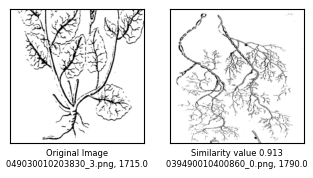

plotting image from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta in format 2fo
reuse in: 14466-useful family herbal or account of all those english plants which are remarkable for their virtues and of drugs which are produced by vegetables of other countries 8vo


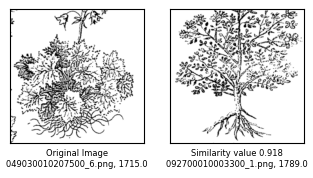

plotting image from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta in format 2fo
reuse in: 2860-essays relating to agriculture and rural affairs 8vo


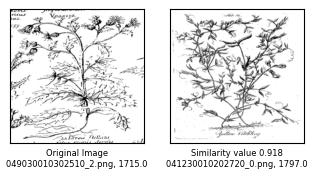

plotting image from 8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta in format 2fo
reuse in: 782-gardeners kalendar directing what works are necessary to be done every month in kitchen fruit and pleasure garden and in conservatory 8vo


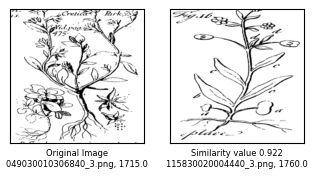

plotting image from X-T148719 in format nan
reuse in: 21399-memoirs of medical society of london instituted in year 1773 vol i 8vo


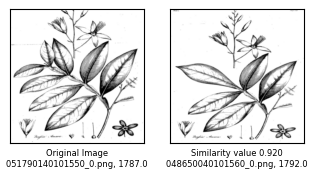

plotting image from 13834-a new medical dictionary or general repository of physic in format 2fo
reuse in: 6871-an introduction to botany containing explanation of theory of that science extracted from works of 8vo


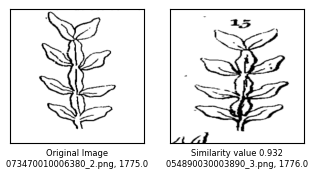

plotting image from 211-english physitian enlarged with three hundred sixty and nine medicines made of english herbs that were not in any impression until this in format 4to
reuse in: 84909-a complete herbal of james newton m 8vo


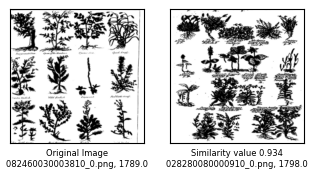

plotting image from X-T83980 in format 2fo
reuse in: 159155-an abridgement of flora londinensis with reduced plates 8vo
reuse in: 211-english physitian enlarged with three hundred sixty and nine medicines made of english herbs that were not in any impression until this 8vo


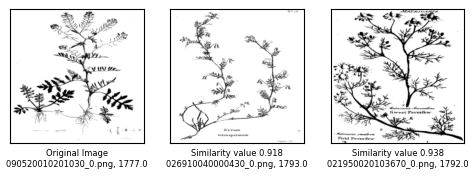

plotting image from 22710-vegetable system or series of experiments and observations tending to explain internal structure and life of plants in format 2fo
reuse in: 22711-virtues of british herbs with history description and figures of several kinds account of diseases they will cure method of giving them and management of patients in each disease containing cures of head-achs by feverfew tea with two singular instances 8vo


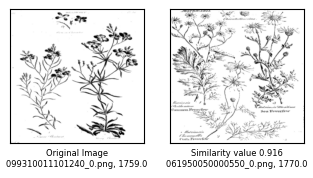

plotting image from 22710-vegetable system or series of experiments and observations tending to explain internal structure and life of plants in format 2fo
reuse in: 159155-an abridgement of flora londinensis with reduced plates 8vo


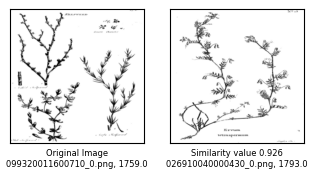

plotting image from 22710-vegetable system or series of experiments and observations tending to explain internal structure and life of plants in format 2fo
reuse in: X-the compleat herbal; or, family physician 8vo


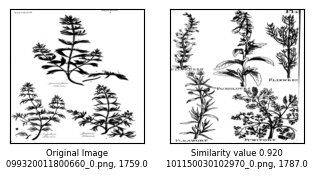

plotting image from 44217-micrographia illustrata or knowledge of microscope explaind together with account of new invented universal single or double microscope either of which is capable of being applied to improvd solar apparatus in format 4to
reuse in: 101136-micrographia illustrata or microscope explained in several new inventions particularly of new variable microscope for examining all sorts of minute objects and also of new camera obscura microscope designed for drawing all minute objects either by light of sun or by lamp in winter evenings to great perfection with description of all other microscopes now in use 8vo


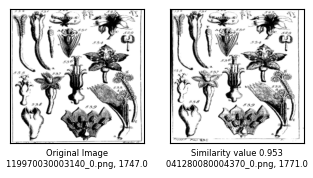

In [24]:
#cases from sth to 8vo?

df_format=df2[df2["gatherings"]!=df2["gatherings_2"]]
df_format=df_format[df_format["gatherings_2"]=="8vo"]
df_format =df_format[df_format["publication_year"] <=df_format["publication_year_2"]]


sort_column=["similarity_score"]
sim_imgs=df_format.sort_values(sort_column,ascending=False).drop_duplicates("work_id_2").head(20).groupby("original_image")["similar_image"].apply(list)
orig_img=df_format.sort_values(sort_column,ascending=False).drop_duplicates("work_id_2").head(20).groupby("original_image")["original_image"].apply(list)

for o, s in zip(orig_img, sim_imgs):
    book= df_format[df_format["original_image"]==o[0]]["work_id"].iloc[0]
    #booknumber = df_format[df_format["original_image"]==o[0]]["n_reuse"].iloc[0]
    book_format = df_format[df_format["original_image"]==o[0]]["gatherings"].iloc[0]
    y = df_format[df_format["original_image"]==o[0]]["publication_year"].iloc[0]
    image = o[0]
    print("plotting image from", str(book), "in format", str(book_format))
    for s_id, f in zip(df_format[df_format["original_image"]==o[0]]["work_id_2"],df_format[df_format["original_image"]==o[0]]["gatherings_2"]):
        print("reuse in:", s_id, f)
    
    plotImages(image,inputDir,df_format)

In [25]:
# just to get an idea of the names and titles, print the different work ids and authors
pd.set_option('max_colwidth', 80)
df_format[["ecco_full_title","ecco_full_title_2"]].sort_values("ecco_full_title").drop_duplicates()

,ecco_full_title,ecco_full_title_2
1355,"A curious herbal, containing five hundred cuts, of the most useful plants, w...","Culpeper's English family physician; or, medical herbal enlarged, with sever..."
1989,"A new medical dictionary; or, general repository of physic. Containing an ex...",An introduction to botany. Containing an explanation of the theory of that s...
768,Culpeper's English physician; and complete herbal. To which are now first ad...,"A complete herbal of the late James Newton, M.D. Containing the prints and t..."
3884,Flora Londinensis: or plates and descriptions of such plants as grow wild in...,An abridgement of the Flora londinensis with reduced plates.
1336,Flora Londinensis: or plates and descriptions of such plants as grow wild in...,"Culpeper's English family physician; or, medical herbal enlarged, with sever..."
326,Memoirs of the Medical Society of London. Instituted in the year 1773. Vol. I.,Memoirs of the Medical Society of London. Instituted in the year 1773. Vol. I.
225,"Micrographia illustrata, or, the knowledge of the microscope explain'd: toge...","Micrographia illustrata: or the microscope explained, in several new inventi..."
52,"Micrographia illustrata, or, the knowledge of the microscope explain'd: toge...","Micrographia illustrata: or the microscope explained, in several new inventi..."
3332,"Plantarum historiae universalis Oxoniensis seu herbarum distributio nova, pe...",The gardeners kalendar; directing what works are necessary to be performed e...
1777,"Plantarum historiae universalis Oxoniensis seu herbarum distributio nova, pe...","English botany; or, coloured figures of British plants, with their essential..."


In [26]:
# co-occurrence
# Create a mapping of unique names to numerical labels
df3 = df_format
# Count co-occurrences of the two columns
co_occurrences = df3.groupby(['work_id', 'work_id_2']).size().reset_index(name='count')

#print(co_occurrences)
co_occurrences.sort_values(by="count", ascending=False)

,work_id,work_id_2,count
14,8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum dis...,782-gardeners kalendar directing what works are necessary to be done every m...,4
10,44217-micrographia illustrata or knowledge of microscope explaind together w...,101136-micrographia illustrata or microscope explained in several new invent...,4
17,X-T83980,159155-an abridgement of flora londinensis with reduced plates,2
6,22710-vegetable system or series of experiments and observations tending to ...,211-english physitian enlarged with three hundred sixty and nine medicines m...,2
1,111468-british herbal history of plants and trees natives of britain cultiva...,84909-a complete herbal of james newton m,2
0,111468-british herbal history of plants and trees natives of britain cultiva...,211-english physitian enlarged with three hundred sixty and nine medicines m...,1
11,8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum dis...,105904-english botany,1
16,X-T148719,21399-memoirs of medical society of london instituted in year 1773 vol i,1
15,8933-a curious herbal containing five hundred cuts of most useful plants whi...,211-english physitian enlarged with three hundred sixty and nine medicines m...,1
13,8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum dis...,2860-essays relating to agriculture and rural affairs,1


This co-occurrence df shows that plantarum historiae and vegetable system have been used the most diversely in different other works.
Let's check this next.

In [27]:
co_occurrences.groupby("work_id").size().sort_values(ascending=False).head()

work_id
22710-vegetable system or series of experiments and observations tending to explain internal structure and life of plants                                                   6
8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta    4
111468-british herbal history of plants and trees natives of britain cultivated for use or raised for beauty                                                                2
X-T83980                                                                                                                                                                    2
13834-a new medical dictionary or general repository of physic                                                                                                              1
dtype: int64

In [28]:
# print correlation from data

vege_system ="22710-vegetable system or series of experiments and observations tending to explain internal structure and life of plants"
plantarum_historiae="8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum distributio nova per tabulas cognationis and affinitatis ex libro naturae observata and detecta"
vs_df=df_format[df_format["work_id"]==vege_system]
ph_df=df_format[df_format["work_id"]==plantarum_historiae]


display(meta[meta["work_id"]==vege_system].head(1)) # John Hill, 1759
display(meta[meta["work_id"]==plantarum_historiae].head(1)) # Robert Morison, 1715

,page_id,ecco_id,page_number,caption_texts,estc_id,ecco_full_title,number_of_pages,language_primary,gatherings,publication_year,publication_decade,work_id,publication_place,publication_country,document_type,sub_category,authors
60,099320011701220,0993200117,122,IRONWORT#SIDERITIS,T50668,"The vegetable system. Or, a series of experiments, and observations tending ...",125,English,2fo,1759.0,1750.0,22710-vegetable system or series of experiments and observations tending to ...,London,England,Book,scientificimprovementnaturalhistory,"Hill, John, 1714?-1775."


,page_id,ecco_id,page_number,caption_texts,estc_id,ecco_full_title,number_of_pages,language_primary,gatherings,publication_year,publication_decade,work_id,publication_place,publication_country,document_type,sub_category,authors
208,049030010100210,0490300101,21,Umbell Rostrat. cognationis S. affinitatis Tab. 6,N20793,"Plantarum historiae universalis Oxoniensis seu herbarum distributio nova, pe...",127,Latin,2fo,1715.0,1710.0,8252-plantarum historiae universalis oxoniensis pars tertia seu herbarum dis...,Oxford,England,Book,scientificimprovementnaturalhistory,"Morison, Robert, 1620-1683."


211-english physitian enlarged with three hundred sixty and nine medicines made of english herbs that were not in any impression until this Culpeper, Nicholas, 1616-1654. 1792.0


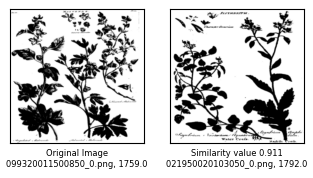

159155-an abridgement of flora londinensis with reduced plates Curtis, William, 1746-1799. 1793.0


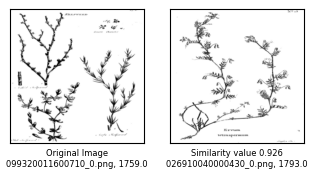

X-the compleat herbal; or, family physician nan 1787.0


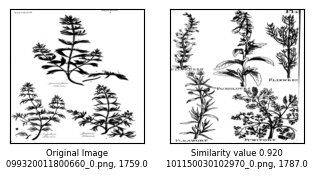

22711-virtues of british herbs with history description and figures of several kinds account of diseases they will cure method of giving them and management of patients in each disease containing cures of head-achs by feverfew tea with two singular instances Hill, John, 1714?-1775. 1770.0


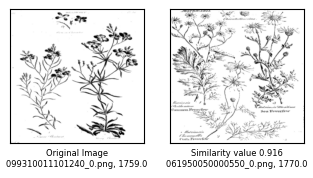

211-english physitian enlarged with three hundred sixty and nine medicines made of english herbs that were not in any impression until this Culpeper, Nicholas, 1616-1654. 1792.0


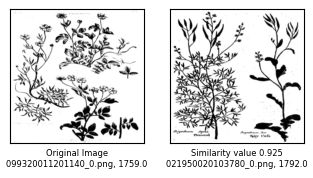

105904-english botany Smith, James Edward, Sir, 1759-1828. 1790.0


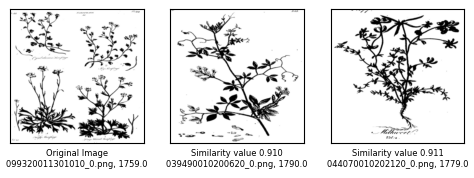

2860-essays relating to agriculture and rural affairs Anderson, James, 1739-1808. 1779.0


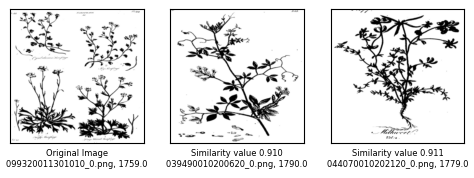

In [29]:
# print images

for i,r in vs_df.iterrows():
    image=r["original_image"]
    book=r["work_id_2"]
    author =r["authors_2"]
    year= r["publication_year_2"]
    print(book, author, year)
    plotImages(image,inputDir,vs_df)

https://a3s.fi/dhh23-em-illu/049030010302510_2.png
2860-essays relating to agriculture and rural affairs Anderson, James, 1739-1808. 1797.0


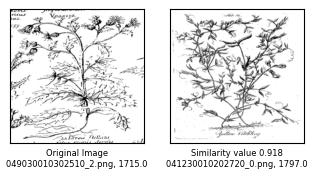

https://a3s.fi/dhh23-em-illu/049030010306840_3.png
782-gardeners kalendar directing what works are necessary to be done every month in kitchen fruit and pleasure garden and in conservatory Miller, Philip, 1691-1771. 1760.0


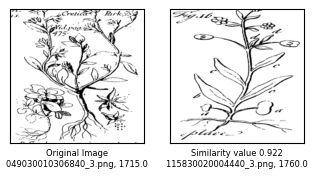

https://a3s.fi/dhh23-em-illu/049030010207500_6.png
14466-useful family herbal or account of all those english plants which are remarkable for their virtues and of drugs which are produced by vegetables of other countries Hill, John, 1714?-1775. 1789.0


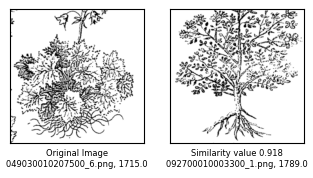

https://a3s.fi/dhh23-em-illu/049030010203830_3.png
105904-english botany Smith, James Edward, Sir, 1759-1828. 1790.0


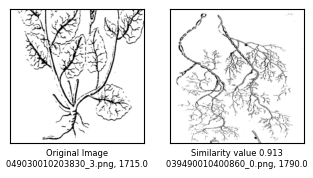

https://a3s.fi/dhh23-em-illu/049030010203800_2.png
782-gardeners kalendar directing what works are necessary to be done every month in kitchen fruit and pleasure garden and in conservatory Miller, Philip, 1691-1771. 1760.0


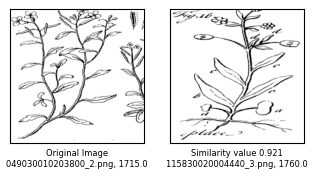

https://a3s.fi/dhh23-em-illu/049030010207560_2.png
782-gardeners kalendar directing what works are necessary to be done every month in kitchen fruit and pleasure garden and in conservatory Miller, Philip, 1691-1771. 1760.0


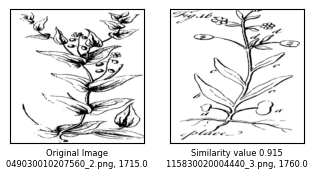

https://a3s.fi/dhh23-em-illu/049030010203780_5.png
782-gardeners kalendar directing what works are necessary to be done every month in kitchen fruit and pleasure garden and in conservatory Miller, Philip, 1691-1771. 1760.0


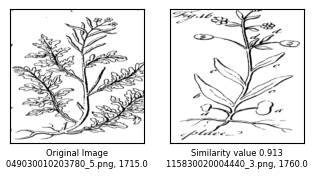

In [32]:
# print images
allas ="https://a3s.fi/dhh23-em-illu/"#000170010400180_0.png
for i,r in ph_df.iterrows():
    image=r["original_image"]
    book=r["work_id_2"]
    author =r["authors_2"]
    year= r["publication_year_2"]
    allas_url=allas+image
    print(allas_url)
    print(book, author, year)
    plotImages(image,inputDir,ph_df)

## Part 3 